In [7]:
# -*- coding:utf-8 -*-
# !/usr/bin/python
# Author: Selvaria
# mnist exercise

import pandas

df_data = pandas.read_csv(r'D:\data\Kaggle\MNIST\train.csv')
df_data.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
#样本形状
#df_test = pandas.read_csv(r'D:\data\Kaggle\MNIST\test.csv')

train_samples= df_data.drop(df_data.columns[0,], axis=1).values
train_samples.shape

(42000, 784)

(28, 28)


<function matplotlib.pyplot.show>

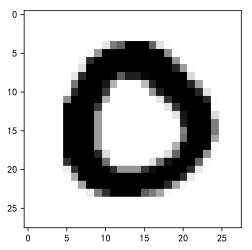

In [102]:
train_single = train_samples.reshape(train_samples.shape[0], 28, 28)
num_single = train_single[4]
print(num_single.shape)

import matplotlib.pyplot as plt

plt.imshow(num_single, cmap=plt.cm.binary)
plt.show

In [5]:
df_test.head()

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
#划分训练集，验证集，测试集
train = df_data.drop(df_data.columns[0,], axis=1)[:30000].values
train_labels = df_data['label'][:30000].values
validation = df_data.drop(df_data.columns[0,], axis=1)[30000:40000].values
vali_labels = df_data['label'][30000:40000].values
test = df_data.drop(df_test.columns[0,], axis=1)[40000:].values
test_labels = df_data['label'][40000:].values

print(train_labels)
print(train.shape)
print(validation.shape)
print(test.shape)

[1 0 1 ... 2 3 0]
(30000, 784)
(10000, 784)
(2000, 784)


In [10]:
#归一化
train = train.astype('float32')/255
validation = validation.astype('float32')/255
test = test.astype('float32')/255

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [44]:
#使用全连接层，最高值在97.5%左右
from keras.models import Sequential 
from keras.layers import Dense, Dropout

model = Sequential()
model.add(Dense(256, activation='relu', input_shape=(784,)))
model.add(Dropout(0.1))
model.add(Dense(256, activation='relu', input_shape=(784,)))
#model.add(Dropout(0.1))
model.add(Dense(10, activation='softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(
    train,
    train_labels,
    epochs=10, 
    batch_size=64, 
    validation_data=(validation,vali_labels)
)

Train on 30000 samples, validate on 10000 samples
Epoch 1/10
30000/30000 [==============================] - 3s 98us/step - loss: 0.3089 - acc: 0.9055 - val_loss: 0.1572 - val_acc: 0.9510
Epoch 2/10
30000/30000 [==============================] - 2s 66us/step - loss: 0.1303 - acc: 0.9602 - val_loss: 0.1043 - val_acc: 0.9683
Epoch 3/10
30000/30000 [==============================] - 2s 71us/step - loss: 0.0882 - acc: 0.9726 - val_loss: 0.0928 - val_acc: 0.9724
Epoch 4/10
30000/30000 [==============================] - 2s 64us/step - loss: 0.0677 - acc: 0.9791 - val_loss: 0.1066 - val_acc: 0.9706
Epoch 5/10
30000/30000 [==============================] - 2s 62us/step - loss: 0.0534 - acc: 0.9824 - val_loss: 0.0953 - val_acc: 0.9732
Epoch 6/10
30000/30000 [==============================] - 2s 66us/step - loss: 0.0429 - acc: 0.9859 - val_loss: 0.1097 - val_acc: 0.9742
Epoch 7/10
30000/30000 [==============================] - 2s 63us/step - loss: 0.0369 - acc: 0.9890 - val_loss: 0.1134 - val_acc

In [68]:
train_data_cross = df_data.drop(df_train.columns[0,], axis=1)[:40000].values
train_cross_labels = df_data['label'][:40000].values

train_cross = train_data_cross.astype('float32')/255

model = Sequential()
model.add(Dense(256, activation='relu', input_shape=(784,)))
#model.add(Dropout(0.1))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(10, activation='softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(
    train_cross,
    train_cross_labels,
    epochs=10, 
    batch_size=128, 
    validation_split=0.1
)

Train on 36000 samples, validate on 4000 samples
Epoch 1/10
36000/36000 [==============================] - 3s 78us/step - loss: 0.3753 - acc: 0.8887 - val_loss: 0.1575 - val_acc: 0.9507
Epoch 2/10
36000/36000 [==============================] - 2s 47us/step - loss: 0.1523 - acc: 0.9544 - val_loss: 0.1098 - val_acc: 0.9643
Epoch 3/10
36000/36000 [==============================] - 2s 48us/step - loss: 0.1017 - acc: 0.9692 - val_loss: 0.1002 - val_acc: 0.9677
Epoch 4/10
36000/36000 [==============================] - 2s 48us/step - loss: 0.0757 - acc: 0.9772 - val_loss: 0.0906 - val_acc: 0.9708
Epoch 5/10
36000/36000 [==============================] - 2s 49us/step - loss: 0.0576 - acc: 0.9830 - val_loss: 0.0834 - val_acc: 0.9758
Epoch 6/10
36000/36000 [==============================] - 2s 45us/step - loss: 0.0480 - acc: 0.9857 - val_loss: 0.0895 - val_acc: 0.9768
Epoch 7/10
36000/36000 [==============================] - 2s 47us/step - loss: 0.0377 - acc: 0.9873 - val_loss: 0.1072 - val_acc:

In [70]:
model = Sequential()
model.add(Dense(256, activation='relu', input_shape=(784,)))
#model.add(Dropout(0.1))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(10, activation='softmax'))

model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(
    train_cross,
    train_cross_labels,
    epochs=10, 
    batch_size=128
)

result = model.evaluate(test, test_labels)
result

Epoch 1/10
40000/40000 [==============================] - 3s 73us/step - loss: 0.3639 - acc: 0.8916
Epoch 2/10
40000/40000 [==============================] - 2s 46us/step - loss: 0.1461 - acc: 0.9570
Epoch 3/10
40000/40000 [==============================] - 2s 48us/step - loss: 0.0986 - acc: 0.9700
Epoch 4/10
40000/40000 [==============================] - 2s 46us/step - loss: 0.0740 - acc: 0.9772
Epoch 5/10
40000/40000 [==============================] - 2s 46us/step - loss: 0.0586 - acc: 0.9811
Epoch 6/10
40000/40000 [==============================] - 2s 48us/step - loss: 0.0463 - acc: 0.9858
Epoch 7/10
40000/40000 [==============================] - 2s 46us/step - loss: 0.0372 - acc: 0.9883
Epoch 8/10
40000/40000 [==============================] - 2s 46us/step - loss: 0.0317 - acc: 0.9897
Epoch 9/10
40000/40000 [==============================] - 2s 48us/step - loss: 0.0255 - acc: 0.9919
Epoch 10/10
2000/2000 [==============================] - 0s 240us/step


[0.1221411738502502, 0.9735]

In [84]:
#cnn
#Conv1D，可能是方法不对，只能在40%左右

from keras import preprocessing

train_c1 = df_data.drop(df_train.columns[0,], axis=1)[:40000].values/255
test_c1 = df_data.drop(df_train.columns[0,], axis=1)[40000:].values/255
train_labels_c1 = df_data['label'][:40000].values
test_labels_c1 = df_data['label'][40000:].values

#x_train = preprocessing.sequence.pad_sequences(train_c1, maxlen=max_len)/255
#x_test = preprocessing.sequence.pad_sequences(test_c1, maxlen=max_len)/255

print(train_c1.shape)
print(train_labels_c1)

(40000, 784)
[1 0 1 ... 0 0 3]


In [92]:
from keras.models import Sequential 
from keras.layers import Dense, Embedding, Conv1D, MaxPooling1D, GlobalMaxPooling1D

model = Sequential()
model.add(Embedding(len(train_c1), 32, input_length=784))
model.add(Conv1D(128, 7, activation='relu'))
model.add(MaxPooling1D(5))
model.add(Conv1D(128, 7, activation='relu'))
model.add(GlobalMaxPooling1D())
model.add(Dense(10, activation = 'softmax'))

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, 784, 32)           1280000   
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 778, 128)          28800     
_________________________________________________________________
max_pooling1d_4 (MaxPooling1 (None, 155, 128)          0         
_________________________________________________________________
conv1d_8 (Conv1D)            (None, 149, 128)          114816    
_________________________________________________________________
global_max_pooling1d_3 (Glob (None, 128)               0         
_________________________________________________________________
dense_152 (Dense)            (None, 10)                1290      
Total params: 1,424,906
Trainable params: 1,424,906
Non-trainable params: 0
_________________________________________________________________


In [93]:
from keras.layers import Flatten

model = Sequential()
model.add(Embedding(len(train_c1), 32, input_length=784))
model.add(Flatten()) #此时形状为(samples, 784 * 32)，降维
model.add(Dense(128, activation='relu'))
model.add(Dense(10, activation='softmax'))
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_6 (Embedding)      (None, 784, 32)           1280000   
_________________________________________________________________
flatten_6 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_153 (Dense)            (None, 128)               3211392   
_________________________________________________________________
dense_154 (Dense)            (None, 10)                1290      
Total params: 4,492,682
Trainable params: 4,492,682
Non-trainable params: 0
_________________________________________________________________


In [94]:
model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit(
    train_c1,
    train_labels_c1,
    epochs=10, 
    batch_size=128
)

result = model.evaluate(test_c1, test_labels_c1)
result

Epoch 1/10
40000/40000 [==============================] - 20s 501us/step - loss: 1.9985 - acc: 0.3019
Epoch 2/10
40000/40000 [==============================] - 20s 506us/step - loss: 1.6625 - acc: 0.4074
Epoch 3/10
40000/40000 [==============================] - 21s 523us/step - loss: 1.6131 - acc: 0.4202
Epoch 4/10
40000/40000 [==============================] - 20s 504us/step - loss: 1.5839 - acc: 0.4284
Epoch 5/10
40000/40000 [==============================] - 21s 520us/step - loss: 1.5625 - acc: 0.4321
Epoch 6/10
40000/40000 [==============================] - 21s 524us/step - loss: 1.5461 - acc: 0.4393
Epoch 7/10
40000/40000 [==============================] - 21s 517us/step - loss: 1.5304 - acc: 0.4438
Epoch 8/10
40000/40000 [==============================] - 21s 526us/step - loss: 1.5178 - acc: 0.4491
Epoch 9/10
40000/40000 [==============================] - 21s 523us/step - loss: 1.5062 - acc: 0.4531
Epoch 10/10
2000/2000 [==============================] - 1s 565us/step


[1.695131820678711, 0.411]

In [96]:
#使用cnn
#Conv2D 准确率能达到99%以上

import numpy as np
np.random.seed(1337)
from keras.models import Sequential 
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.utils import np_utils
from keras.optimizers import RMSprop #优化器采用RMSprop，加速神经网络训练方法

train_c2 = df_data.drop(df_train.columns[0,], axis=1)[:40000].values
test_c2 = df_data.drop(df_train.columns[0,], axis=1)[40000:].values
train_labels_c2 = df_data['label'][:40000].values
test_labels_c2 = df_data['label'][40000:].values

X_train = train_c2.reshape(train_c2.shape[0], 28, 28, 1)
X_test = test_c2.reshape(test_c2.shape[0], 28, 28, 1)
X_train = X_train.astype('float32')/255
X_test = X_test.astype('float32')/255

y_train = np_utils.to_categorical(train_labels_c2, 10)
y_test = np_utils.to_categorical(test_labels_c2, 10)

model = Sequential()

#卷积层Convolutional
model.add(Conv2D(
    filters=32, #从原来的的1张图生成32张图
    kernel_size=(5,5), #filter的宽和
    padding = 'same', #padding method
    input_shape=(28,28,1), #1是高度（黑白是1，彩色是3），后面是高和宽 
    activation ='relu'
))


#取样层pooling
model.add(MaxPooling2D(
    pool_size=(2,2),#
    strides=(2,2), #取样跳过的像素长度
    padding='same'
))

#第2个卷积层Convolutional
model.add(Conv2D(64,(5,5),padding='same',activation ='relu'))

#第2个取样层pooling
model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
model.add(Dropout(0.25))

#全连接层
model.add(Flatten()) #将三维的层抹平成一维的层
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
#第二个连接层
model.add(Dense(10, activation='softmax'))

#Compile model.
model.compile(loss='categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

#train
print('\nNow training...')
model.fit(X_train, y_train, epochs=7, batch_size=64) 

#test
print('\nNow testing...')
loss, accuracy = model.evaluate(X_test, y_test) 

print('Now test loss:', loss)
print('Now test accuracy:',accuracy)


Now training...
Epoch 1/7
40000/40000 [==============================] - 48s 1ms/step - loss: 0.2129 - acc: 0.9322
Epoch 2/7
40000/40000 [==============================] - 47s 1ms/step - loss: 0.0687 - acc: 0.9787
Epoch 3/7
40000/40000 [==============================] - 47s 1ms/step - loss: 0.0509 - acc: 0.9845
Epoch 4/7
40000/40000 [==============================] - 46s 1ms/step - loss: 0.0414 - acc: 0.9871
Epoch 5/7
40000/40000 [==============================] - 48s 1ms/step - loss: 0.0358 - acc: 0.9892
Epoch 6/7
40000/40000 [==============================] - 52s 1ms/step - loss: 0.0296 - acc: 0.9908
Epoch 7/7
40000/40000 [==============================] - 51s 1ms/step - loss: 0.0250 - acc: 0.9923

Now testing...
2000/2000 [==============================] - 1s 713us/step
Now test loss: 0.02631644423038233
Now test accuracy: 0.9915


In [117]:
#构建使用了数据增强的训练集和测试集，基于数据源的array数组，准确率在98.5%

from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
    rescale = 1/255, #对图片的每个像素值均乘上这个放缩因子，把像素值放缩到0和1之间有利于模型的收敛
    rotation_range = 40, #角度值，0-180.表示图像随机旋转的角度范围
    width_shift_range = 0.2, #平移比例，下同
    height_shift_range = 0.2,
    shear_range = 0.2, #随机错切变换角度
    zoom_range = 0.2, #随机缩放比例
    horizontal_flip = True, #随机将一半图像水平翻转，主要用于真实世界的图像（即没有水平不对称的假设前提下）
    #zca_whitening=True, #白化处理，只适用于mnist这种只有1条通道的黑白图像，但是本次是传入numpy图像，用不到
    fill_mode='nearest' #填充新创建像素的方法
)

test_datagen = ImageDataGenerator(rescale=1/255) #注意验证集的数据不能增强

train_advance = df_data.drop(df_data.columns[0,], axis=1)[:40000].values
test_advance = df_data.drop(df_data.columns[0,], axis=1)[40000:].values
train_labels_ad = df_data['label'][:40000].values
test_labels_ad = df_data['label'][40000:].values

X_train = train_advance.reshape(train_advance.shape[0], 28, 28, 1)
X_test = test_advance.reshape(test_advance.shape[0], 28, 28, 1)
#X_train = X_train.astype('float32')/255
#X_test = X_test.astype('float32')/255

train_generator = train_datagen.flow(
    x = X_train,
    y = train_labels_ad,
    batch_size = 400 #每批量样本大小
    #class_mode = 'categorical' #因为使用了categorical_crossentropy损失函数，所以用二进制标签
)

test_generator = test_datagen.flow(
    x = X_test, 
    y = test_labels_ad,
    batch_size = 20
    #class_mode = 'categorical' 
)

D:\Selvaria\Anaconda3\lib\site-packages\keras_preprocessing\image\image_data_generator.py:334: UserWarning: This ImageDataGenerator specifies `zca_whitening`, which overrides setting of `featurewise_center`.
  warnings.warn('This ImageDataGenerator specifies '


In [118]:
model = Sequential()

model.add(Conv2D(32,(4,4), padding='same', input_shape=(28,28,1), activation ='relu'))
model.add(MaxPooling2D(pool_size=(2,2), padding='same'))
model.add(Conv2D(64,(4,4),padding='same',activation ='relu'))
model.add(MaxPooling2D(pool_size=(2,2),padding='same'))
model.add(Dropout(0.25))
model.add(Conv2D(128,(3,3), activation='relu')) 
model.add(MaxPooling2D((2,2)))
model.add(Dropout(0.25))

model.add(Flatten()) #将三维的层抹平成一维的层
model.add(Dropout(0.5))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(10, activation='softmax'))

#model.compile(loss='binary_crossentropy', optimizer=optimizers.RMSprop(lr=1e-4), metrics=['acc'])
model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = model.fit_generator(
    train_generator,
    steps_per_epoch = 100, #40000/400
    epochs = 40, #增加了训练批次
    validation_data = test_generator, 
    validation_steps = 100 #2000/20
)

Epoch 1/40


D:\Selvaria\Anaconda3\lib\site-packages\keras_preprocessing\image\image_data_generator.py:699: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
D:\Selvaria\Anaconda3\lib\site-packages\keras_preprocessing\image\image_data_generator.py:718: UserWarning: This ImageDataGenerator specifies `zca_whitening`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


100/100 [==============================] - 33s 331ms/step - loss: 1.4678 - acc: 0.5027 - val_loss: 0.2823 - val_acc: 0.9285
Epoch 2/40
100/100 [==============================] - 32s 324ms/step - loss: 0.7538 - acc: 0.7580 - val_loss: 0.2154 - val_acc: 0.9425
Epoch 3/40
100/100 [==============================] - 32s 325ms/step - loss: 0.5268 - acc: 0.8348 - val_loss: 0.1318 - val_acc: 0.9585
Epoch 4/40
100/100 [==============================] - 33s 326ms/step - loss: 0.4143 - acc: 0.8704 - val_loss: 0.1167 - val_acc: 0.9670
Epoch 5/40
100/100 [==============================] - 32s 323ms/step - loss: 0.3488 - acc: 0.8908 - val_loss: 0.0969 - val_acc: 0.9690
Epoch 6/40
100/100 [==============================] - 32s 318ms/step - loss: 0.3136 - acc: 0.9027 - val_loss: 0.0987 - val_acc: 0.9690
Epoch 7/40
100/100 [==============================] - 32s 319ms/step - loss: 0.2857 - acc: 0.9108 - val_loss: 0.0903 - val_acc: 0.9705
Epoch 8/40
100/100 [==============================] - 32s 321ms/st

In [121]:
print(model.evaluate_generator(test_generator, steps = 40))

[0.04705243364605849, 0.9849999964237213]


D:\Selvaria\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


KeyboardInterrupt: 

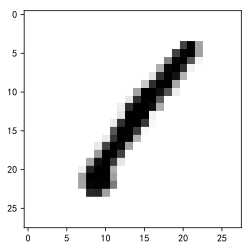

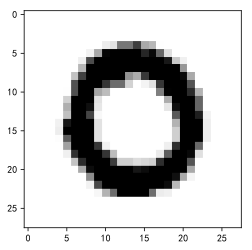

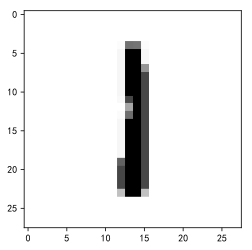

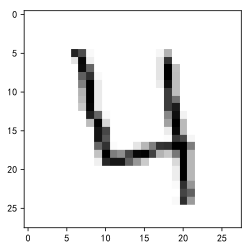

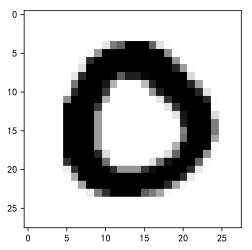

...

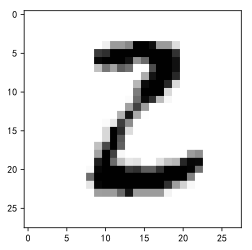

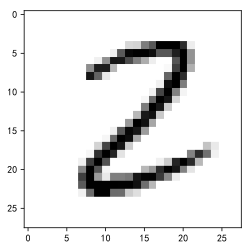

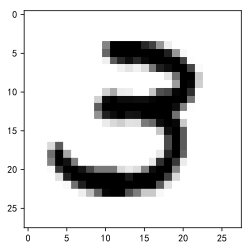

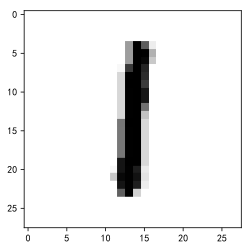

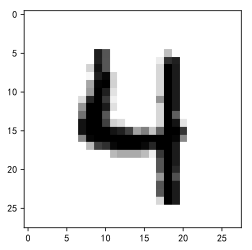

In [ ]:
#构建使用了数据增强的训练集和测试集，基于数组转化的实际图像

import os
import matplotlib.pyplot as plt

train_advance = df_data.drop(df_data.columns[0,], axis=1)[:40000].values
test_advance = df_data.drop(df_data.columns[0,], axis=1)[40000:].values

train_img_array = train_advance.reshape(train_advance.shape[0], 28, 28)
test_img_array = test_advance.reshape(test_advance.shape[0], 28, 28)

def save_img(array_tuple, file, name): #图片存储函数，输入图片向量矩阵, 文件路径和图片名字
    plt.figure(name)
    plt.imshow(array_tuple, cmap=plt.cm.binary)
    plt.savefig('D:/data/Kaggle/MNIST/picture/{}/{}.png'.format(file, name)) #保存文件
    
for i in range(len(train_img_array)):
    save_img(train_img_array[i],'train', str(i))
print('训练图像数量：', len(os.listdir(r'D:\data\Kaggle\MNIST\picture\train')))
    
for i in range(len(test_img_array)):
    save_img(test_img_array[i],'test', str(i))
print('验证图像数量：', len(os.listdir(r'D:\data\Kaggle\MNIST\picture\test')))